In [11]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [18]:
!nvidia-smi

Tue Oct 31 15:59:40 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.105.17   Driver Version: 525.105.17   CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla V100-SXM2...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   35C    P0    24W / 300W |      0MiB / 16384MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [19]:
!pip install ultralytics

In [20]:
from ultralytics import YOLO
import os
from IPython.display import display, Image
from IPython import display
display.clear_output()
!yolo checks

Ultralytics YOLOv8.0.203 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla V100-SXM2-16GB, 16151MiB)
Setup complete ✅ (8 CPUs, 51.0 GB RAM, 28.3/166.8 GB disk)

OS                  Linux-5.15.120+-x86_64-with-glibc2.35
Environment         Colab
Python              3.10.12
Install             pip
RAM                 51.00 GB
CPU                 Intel Xeon 2.20GHz
CUDA                11.8

matplotlib          ✅ 3.7.1>=3.3.0
numpy               ✅ 1.23.5>=1.22.2
opencv-python       ✅ 4.8.0.76>=4.6.0
pillow              ✅ 9.4.0>=7.1.2
pyyaml              ✅ 6.0.1>=5.3.1
requests            ✅ 2.31.0>=2.23.0
scipy               ✅ 1.11.3>=1.4.1
torch               ✅ 2.1.0+cu118>=1.8.0
torchvision         ✅ 0.16.0+cu118>=0.9.0
tqdm                ✅ 4.66.1>=4.64.0
pandas              ✅ 1.5.3>=1.1.4
seaborn             ✅ 0.12.2>=0.11.0
psutil              ✅ 5.9.5
py-cpuinfo          ✅ 9.0.0
thop                ✅ 0.1.1-2209072238>=0.1.1


In [23]:
model = YOLO('yolov8m.pt')

In [24]:
!yolo task=detect mode=train model=yolov8m.pt data=/content/drive/MyDrive/dataset/data.yaml epochs=30 imgsz=640

Ultralytics YOLOv8.0.203 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla V100-SXM2-16GB, 16151MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.pt, data=/content/drive/MyDrive/dataset/data.yaml, epochs=30, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torc

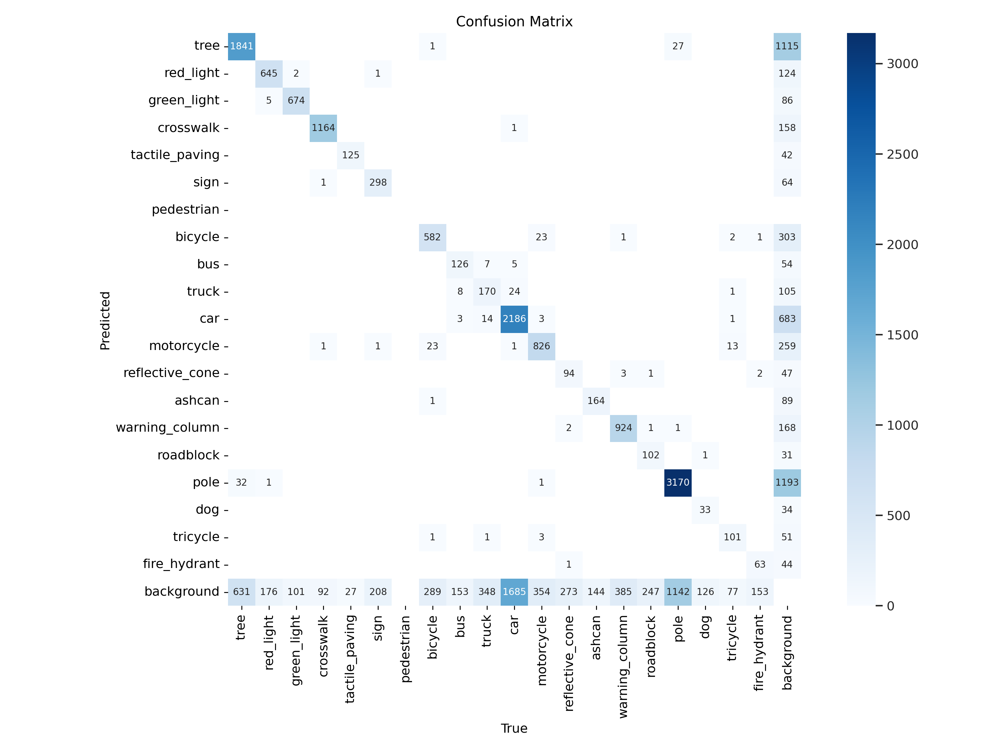

In [25]:
Image(filename=f'/content/runs/detect/train/confusion_matrix.png', width=600)

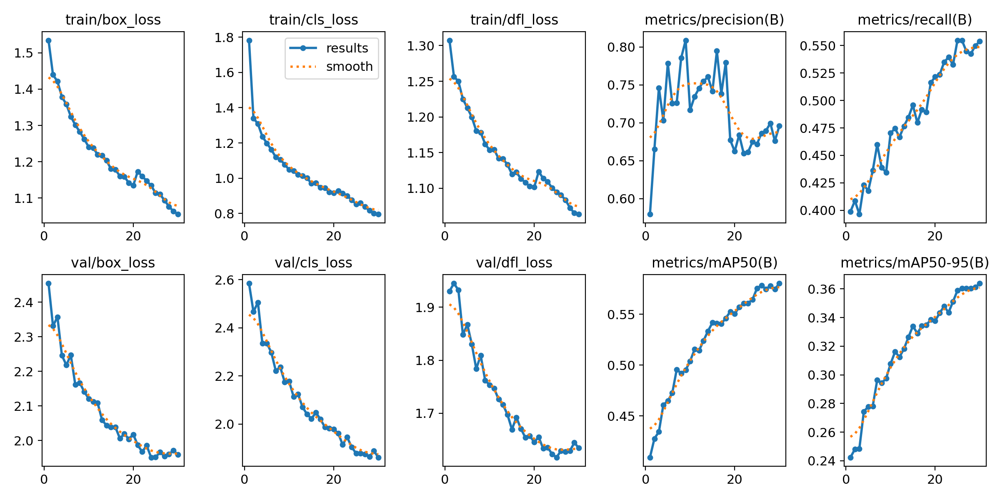

In [26]:
Image(filename=f'/content/runs/detect/train/results.png', width=600)

In [27]:
!yolo task=detect mode=val model=/content/runs/detect/train/weights/best.pt data=/content/drive/MyDrive/dataset/data.yaml

Ultralytics YOLOv8.0.203 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla V100-SXM2-16GB, 16151MiB)
Model summary (fused): 218 layers, 25851340 parameters, 0 gradients, 78.7 GFLOPs
val: Scanning /content/drive/MyDrive/dataset/val/labels.cache... 2103 images, 17 backgrounds, 0 corrupt: 100% 2103/2103 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 132/132 [00:23<00:00,  5.72it/s]
                   all       2103      20121      0.704      0.551      0.581      0.365
                  tree       2103       2504       0.65      0.713      0.716      0.395
             red_light       2103        827      0.853       0.78      0.803      0.533
           green_light       2103        777      0.886      0.865      0.891      0.594
             crosswalk       2103       1258      0.892      0.918      0.938      0.801
        tactile_paving       2103        152      0.705      0.803      0.786      0.535
                  si

In [28]:
!yolo task=detect mode=predict model=/content/runs/detect/train/weights/best.pt conf=0.5 source=/content/drive/MyDrive/dataset/test/images

Ultralytics YOLOv8.0.203 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla V100-SXM2-16GB, 16151MiB)
Model summary (fused): 218 layers, 25851340 parameters, 0 gradients, 78.7 GFLOPs

image 1/2194 /content/drive/MyDrive/dataset/test/images/20000009.jpg: 448x640 (no detections), 61.0ms
image 2/2194 /content/drive/MyDrive/dataset/test/images/20000011.jpg: 384x640 (no detections), 58.6ms
image 3/2194 /content/drive/MyDrive/dataset/test/images/20000018.jpg: 480x640 (no detections), 60.6ms
image 4/2194 /content/drive/MyDrive/dataset/test/images/20000023.jpg: 480x640 (no detections), 9.1ms
image 5/2194 /content/drive/MyDrive/dataset/test/images/20000025.jpg: 480x640 1 truck, 8.7ms
image 6/2194 /content/drive/MyDrive/dataset/test/images/20000033.jpg: 480x640 (no detections), 8.6ms
image 7/2194 /content/drive/MyDrive/dataset/test/images/20000034.jpg: 352x640 (no detections), 60.8ms
image 8/2194 /content/drive/MyDrive/dataset/test/images/20000037.jpg: 480x640 (no detections), 9.9ms
image 9/2194 /

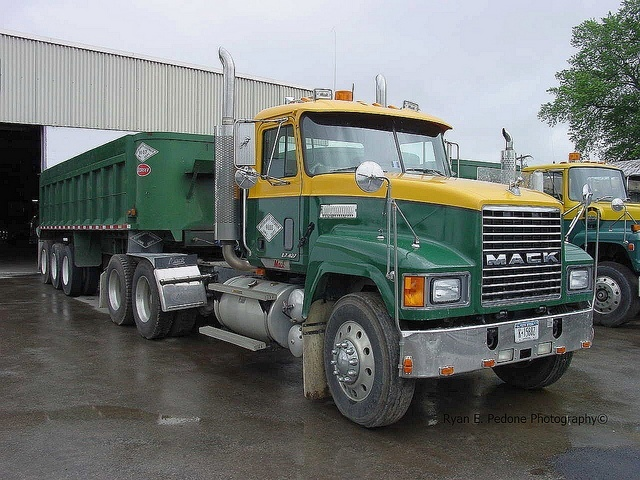

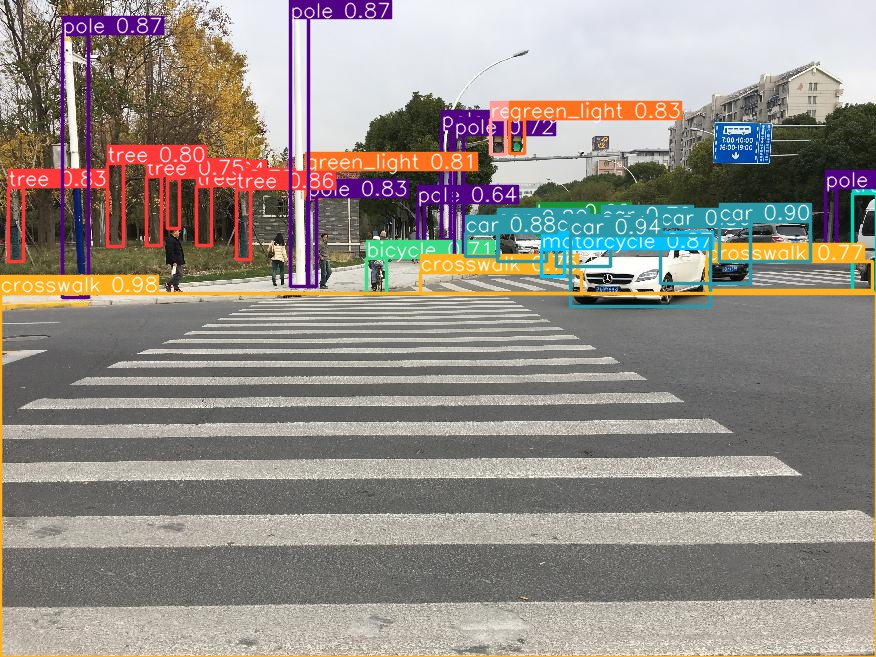

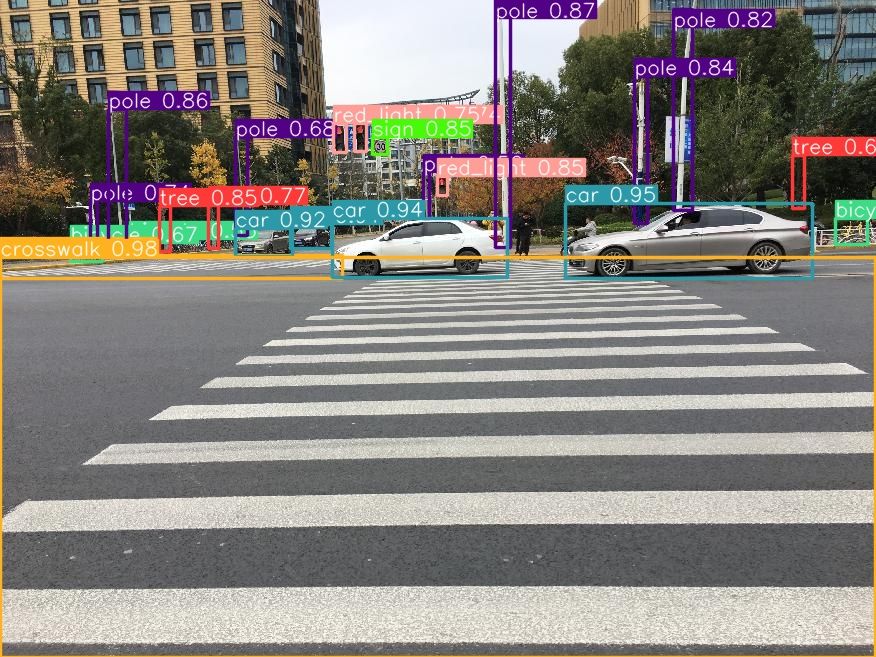

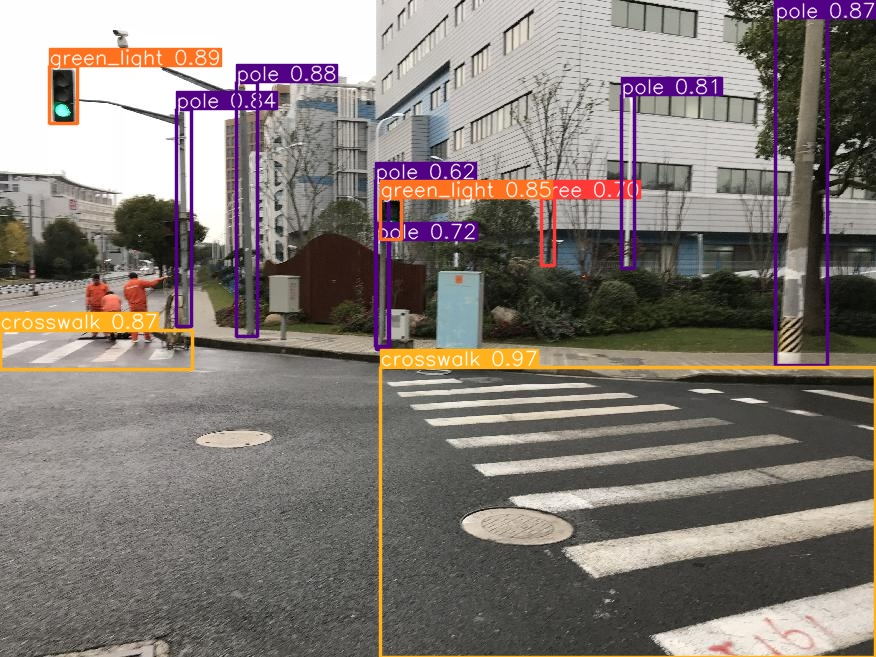

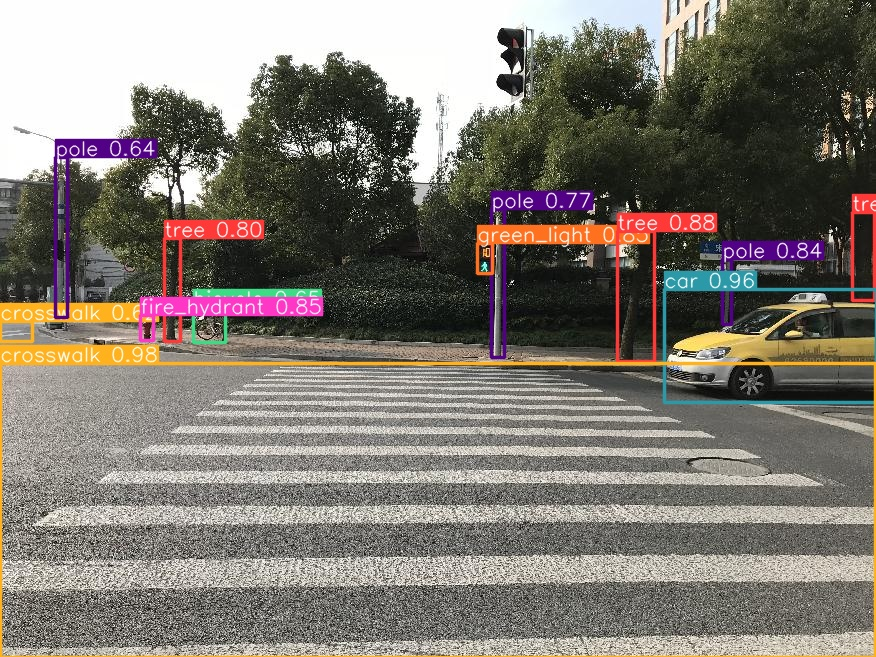

...

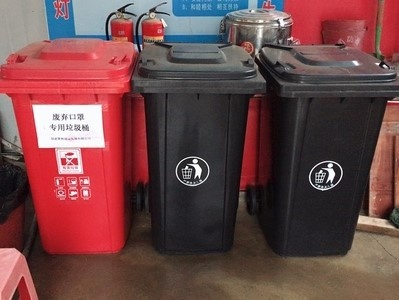

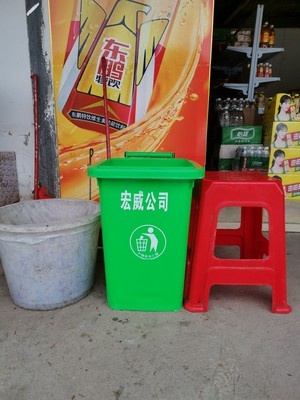

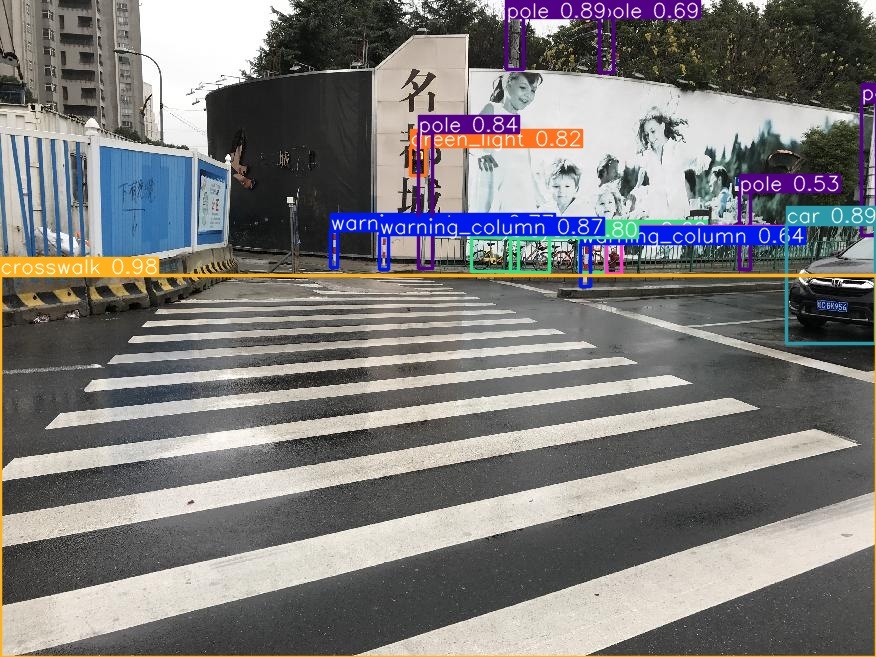

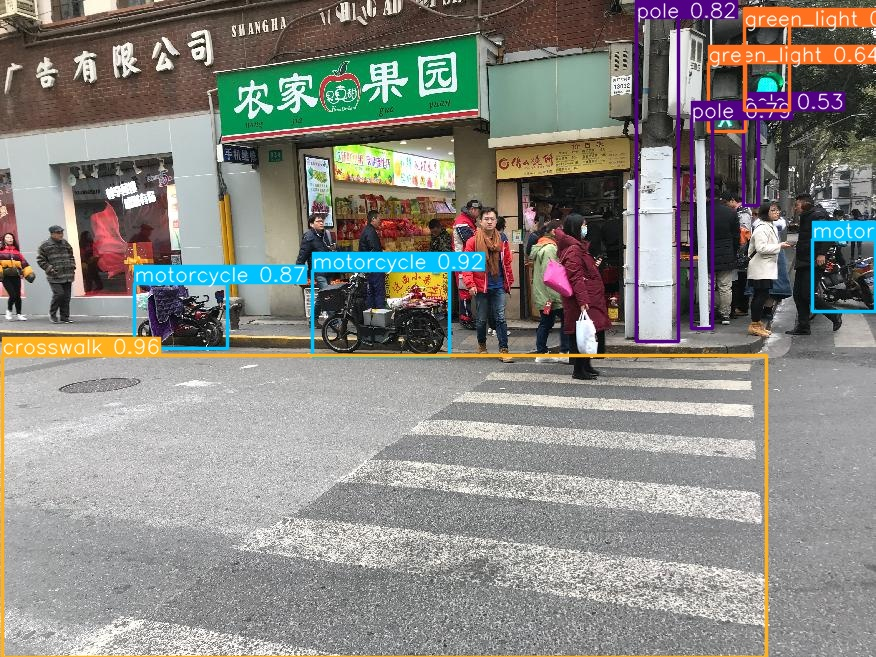

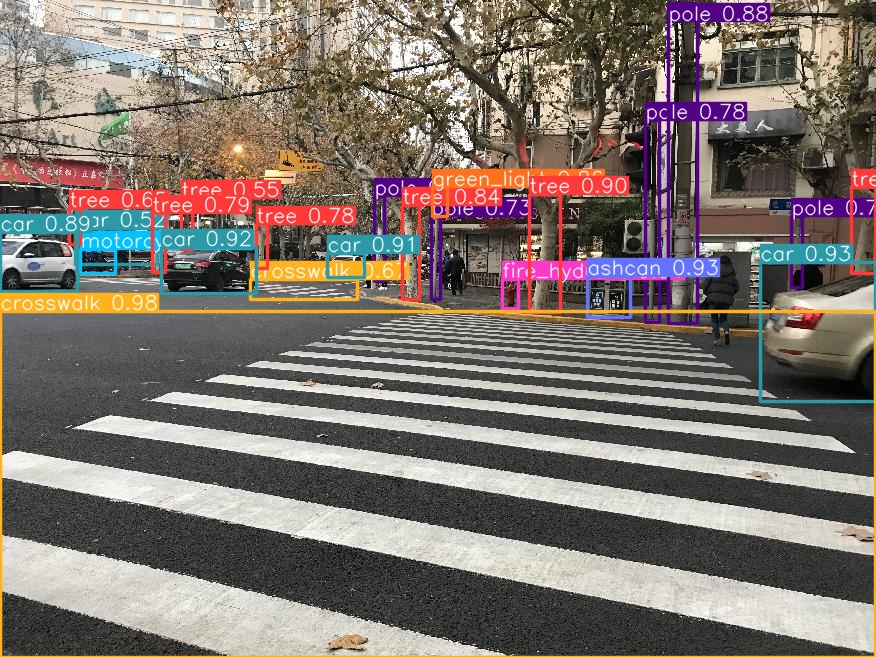

In [ ]:
import glob
from IPython.display import Image, display
for image_path in glob.glob(f'/content/runs/detect/predict/*.jpg'):
  display(Image(filename=image_path, height=600))
  print("\n")